# The goals / steps of this project are the following:

1. Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
2. Apply a distortion correction to raw images.
3. Use color transforms, gradients, etc., to create a thresholded binary image.
4. Apply a perspective transform to rectify binary image ("birds-eye view").
5. Detect lane pixels and fit to find the lane boundary.
6. Determine the curvature of the lane and vehicle position with respect to center.
7. Warp the detected lane boundaries back onto the original image.
8. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

# Setup & imports

In [52]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import pickle
%matplotlib inline


## Utility methods

In [74]:
def save_image(path, img):
#     plt.imsave(path, img)
    cv2.imwrite(path, img)

def read_image(img_path):
    #read img
    #return mpimg.imread(img_path) #RGB
    return cv2.imread(img_path) #BGR

def show_before_after(before, after):
    # Visualize undistortion
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(before)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(after)
    ax2.set_title('Processed Image', fontsize=30)
    
def show_images(img1, img2=None, title1='before', title2='after', fontsize=30):
    """Display 1 or 2 images
    
    Parameters
    ----------
    img1 : numpy.ndarray
        image 1 (BGR format)
    title1 : str
        title 1
    img2 : numpy.ndarray, None
        image 2 (BGR format)
    title2 : str, None
        title 2
    fontsize : int
        the font size for the image titles
    
    """
    # Visualize the images
    if img2 is None:
        f, ax1 = plt.subplots(1, 1, figsize=(20,10))
    else:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        
        # show image 2
        if len(img2.shape) == 2:
            ax2.imshow(img2, cmap='gray')
        else:
            ax2.imshow(img2[:,:,::-1])
        ax2.set_title(title2, fontsize=fontsize)
        
    # show image 1
    if len(img1.shape) == 2:
        ax1.imshow(img1, cmap='gray')
    else:
        ax1.imshow(img1[:,:,::-1])
    ax1.set_title(title1, fontsize=30)
    
    plt.show()
    


# 1. Compute the camera calibration matrix and distortion coefficients given a set of chessboard images

In [57]:
def calibrate_camera(calibrate_img_paths, nx, ny, outDir = None):
    '''
    given calibration images as input (calibrate_img_paths) and their number of inside corners in x,y (nx, ny)
    return the camera calibration matrix (mtx) and distortion corefficients (dist) and use these later down the pipeline
    code used from lesson: https://classroom.udacity.com/nanodegrees/nd013/parts/edf28735-efc1-4b99-8fbb-ba9c432239c8/modules/5d1efbaa-27d0-4ad5-a67a-48729ccebd9c/lessons/78afdfc4-f0fa-4505-b890-5d8e6319e15c/concepts/5415176a-d615-49af-8535-53a385768a23
    repo: https://github.com/udacity/CarND-Camera-Calibration
    '''
    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((ny*nx,3), np.float32)
    objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)
    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.
    img_size = None
    # Step through the list and search for chessboard corners
    for idx, fname in enumerate(calibrate_img_paths):
#         print(idx)
        img = cv2.imread(fname)
        if img_size == None:
            img_size = (img.shape[1], img.shape[0])
        #convert to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)
        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)
            # Draw and display the corners
            cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
            if outDir != None:
                write_name = '{}/calibration_corners{}.jpg'.format(outDir, str(idx+1))
                save_image(write_name, img)
                if(idx < 2):
                    show_images(img,write_name) #display some samples
        
    # Do camera calibration given object points and image points
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
    return mtx, dist    

In [36]:
#save calibration outputs for chess corners & undistort in output directory
outDirectory = 'camera_cal_out'
if not os.path.exists(outDirectory):
    os.makedirs(outDirectory)
    
#call method for the 20 calibration images in folder
calibrate_img_paths = glob.glob('camera_cal/calibration*.jpg')
mtx, dist = calibrate_camera(calibrate_img_paths, 9, 6, outDirectory)

# Save the camera calibration result for later use & save time (we won't worry about rvecs / tvecs)
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "{}/mtx_dist_pickle.p".format(outDirectory), "wb" ) )

print('completed calibration & undistortion')

completed calibration & undistortion


# 2. Apply a distortion correction to raw images

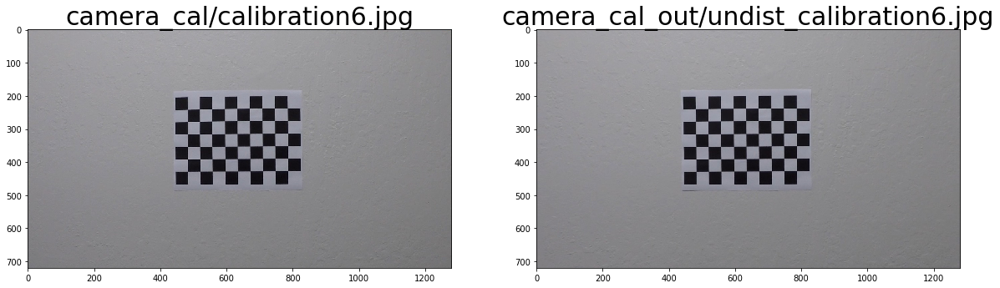

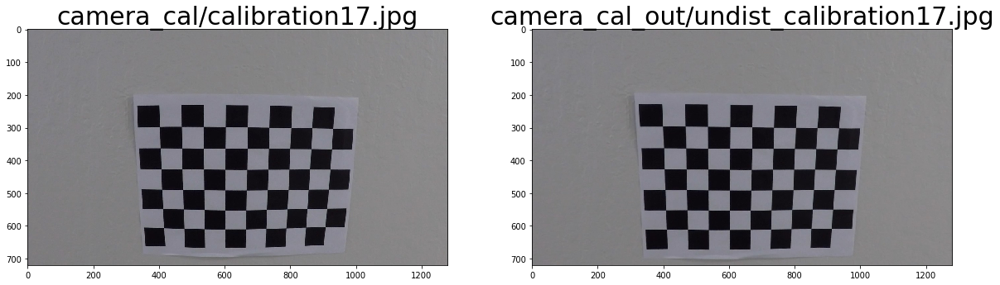

undistortion completed


In [75]:
def undistort(mtx, dist, raw_image_paths, outDir = None):
    all_images = []
    for idx, fname in enumerate(raw_image_paths):
        img = cv2.imread(fname)
        dst = cv2.undistort(img, mtx, dist, None, mtx)
        if outDir != None:
            write_name = '{}/undist_{}'.format(outDir,os.path.basename(fname)) 
            save_image(write_name,dst)
            if(idx < 2):
                show_images(img,dst,fname,write_name) #display some samples

def undistort_bulk(paths, outDir=None):
    #load pickled mtx, dist & run undistort
    # load the object from the file into var b
    pickle_load = pickle.load(open("{}/mtx_dist_pickle.p".format(outDirectory),'rb'))  
    # print(pickle_load)
    undistort(pickle_load['mtx'], pickle_load['dist'], paths, outDir)
    print('undistortion completed')
    
undistort_bulk(calibrate_img_paths, outDirectory)


## 2.a Undistorting test images and saving them in output images

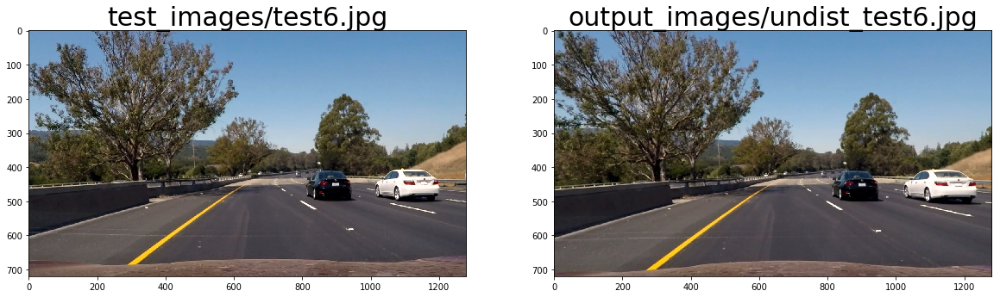

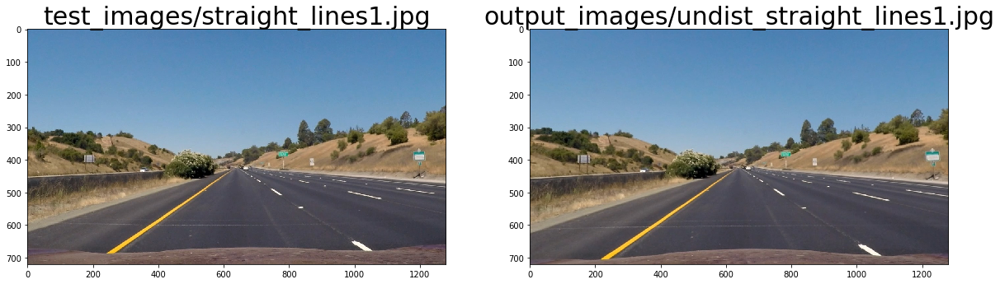

undistortion completed


In [76]:
test_image_paths = glob.glob('test_images/*.jpg')

undistort_bulk(test_image_paths, 'output_images')

# 3. Use color transforms, gradients, etc., to create a thresholded binary image.

Lets define different transforms that we can apply on undistorted images produced above to get thresholded binary images. Remember to use mpimg.imread for reading images because cvtColor method uses cv2.COLOR_RGB2GRAY constant.

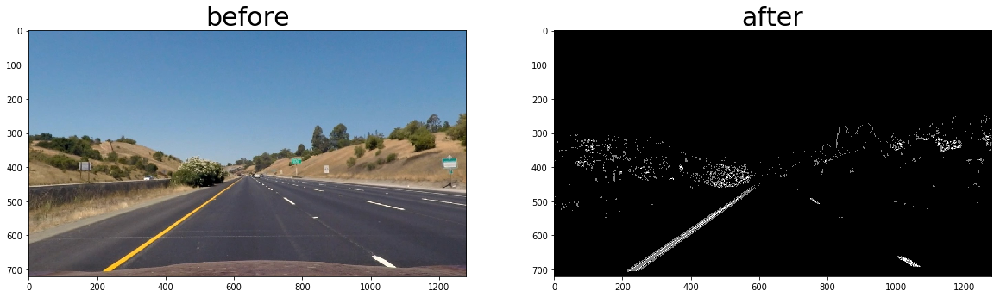

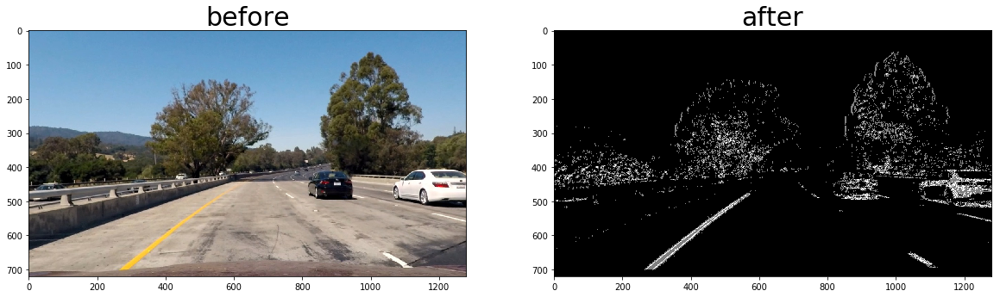

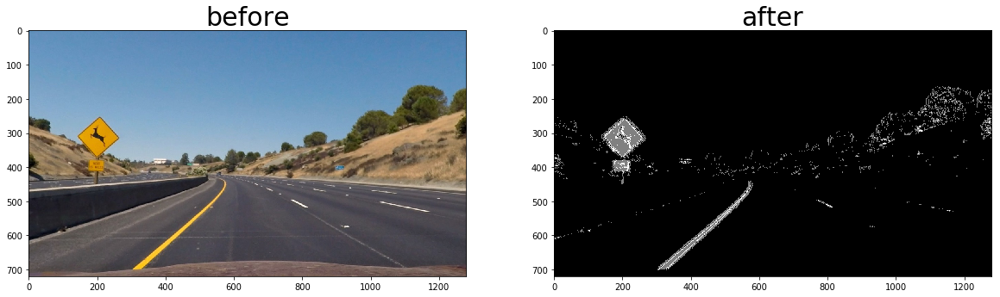

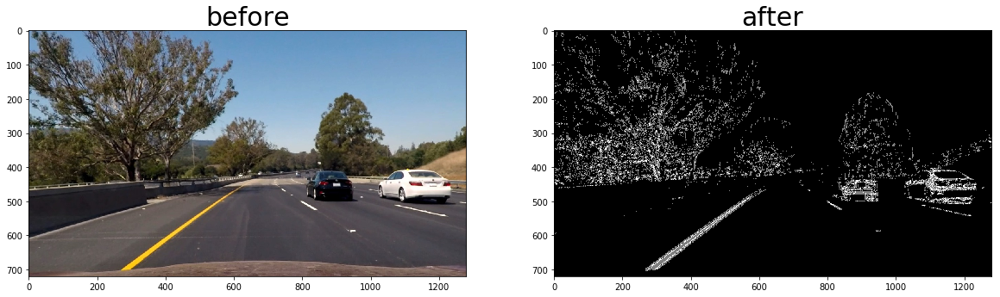

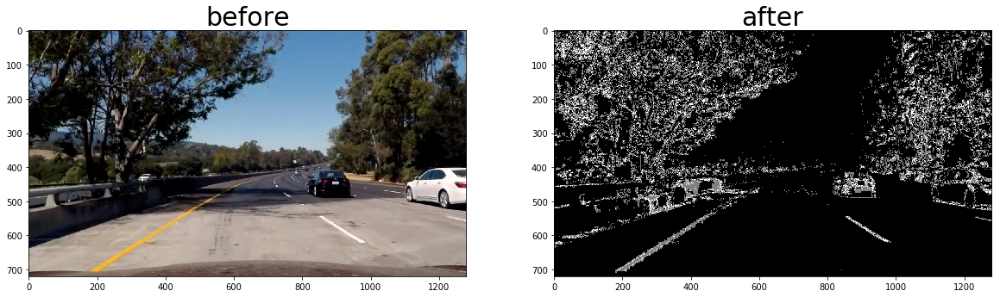

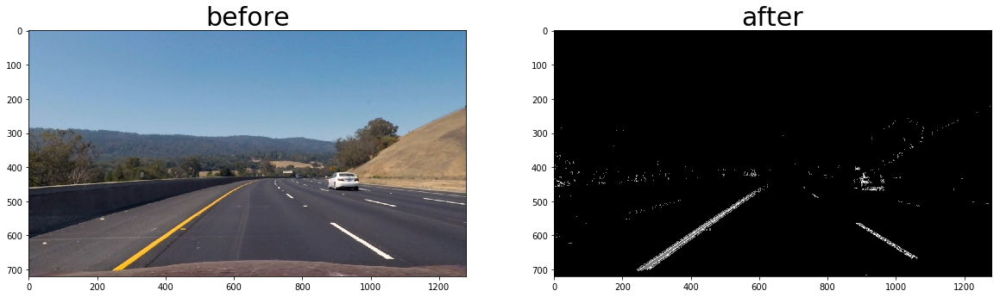

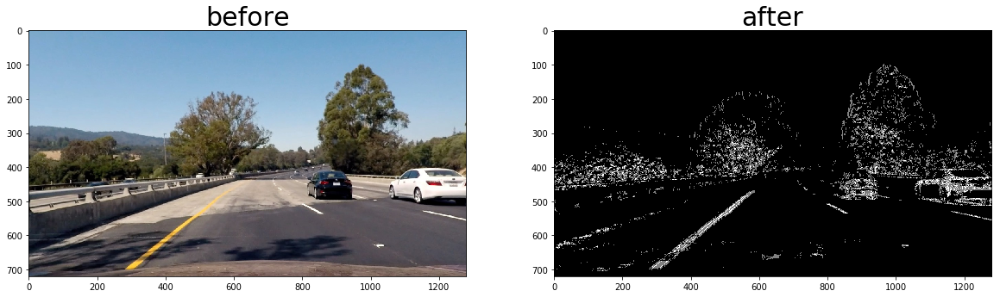

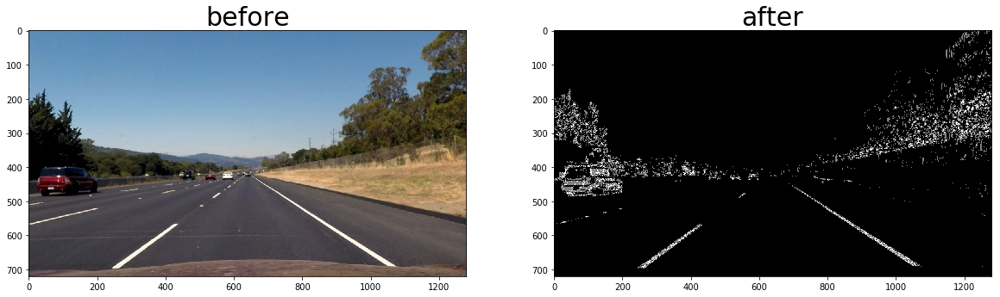

In [96]:
def s_channel_sobelx_threshold(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
    img = np.copy(img)
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    # l_channel = hls[:,:,0]
    s_channel = hls[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(s_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    # Threshold color channel
    s_binary = np.zeros_like(scaled_sobel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1

    # Stack each channel
#     binary = np.dstack(( sxbinary, sxbinary, s_binary)) * 255 #BGR
    binary = cv2.addWeighted(sxbinary, 1.0, s_binary, 1.0, 0)
    return binary

for p in glob.glob('output_images/undist_*.jpg'):
    undist = cv2.imread(p)
    binary = s_channel_sobelx_threshold(undist)
    show_images(undist, binary) #display some samples


# 4. Apply a perspective transform to rectify binary image ("birds-eye view").

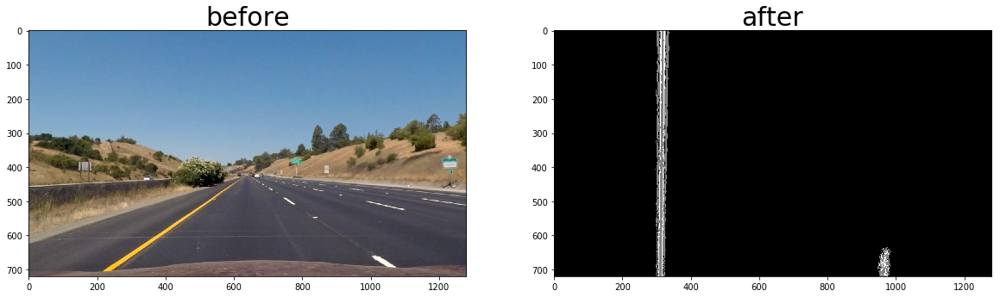

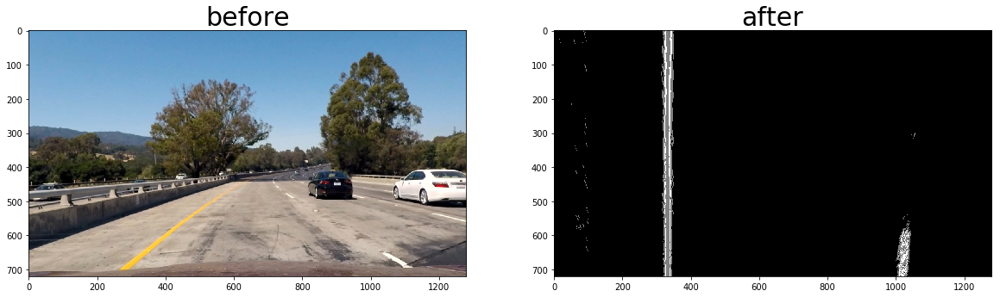

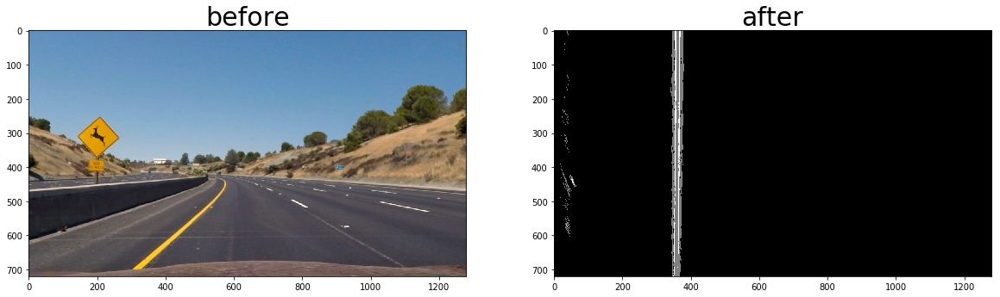

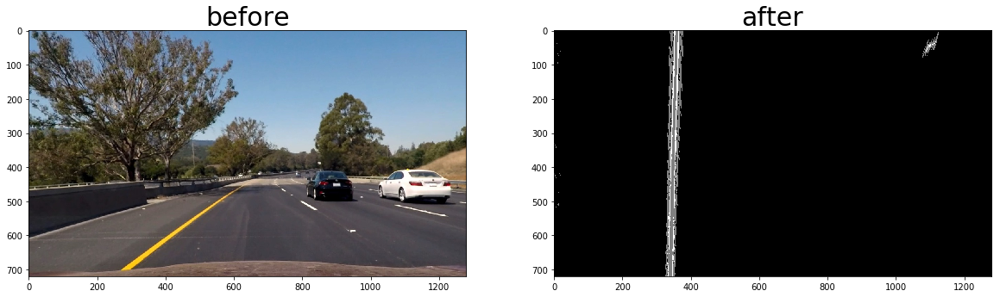

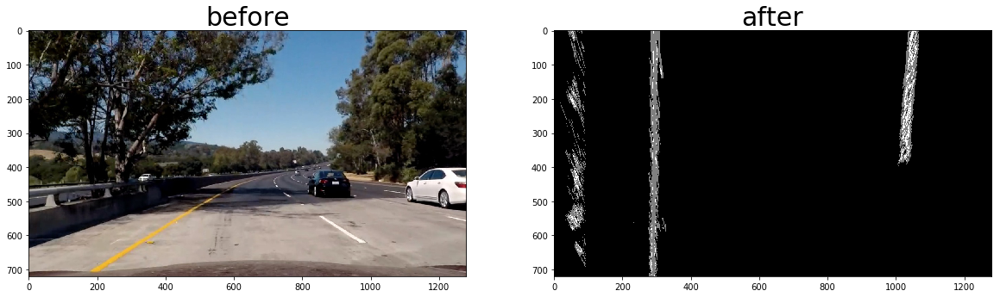

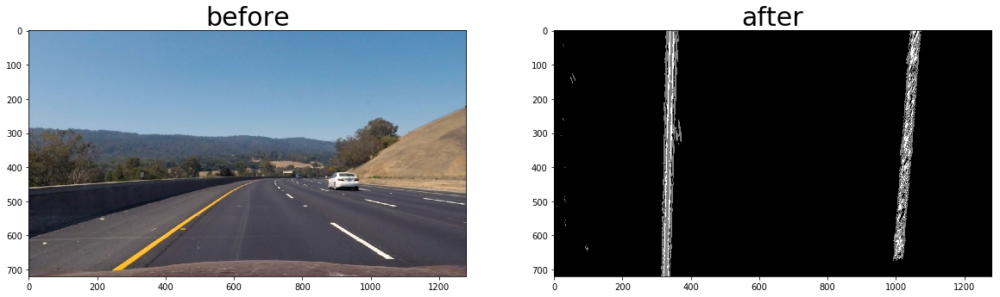

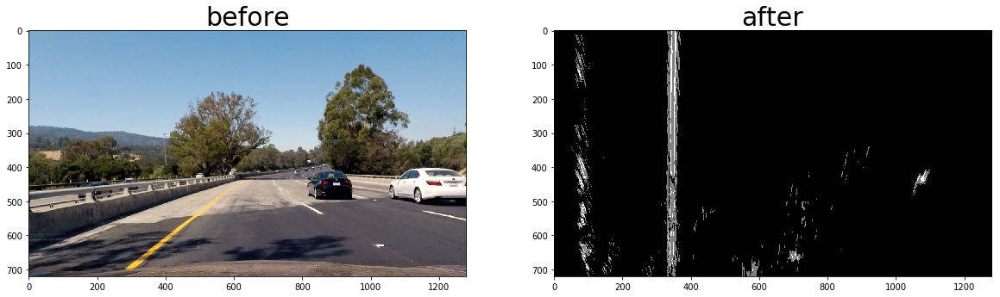

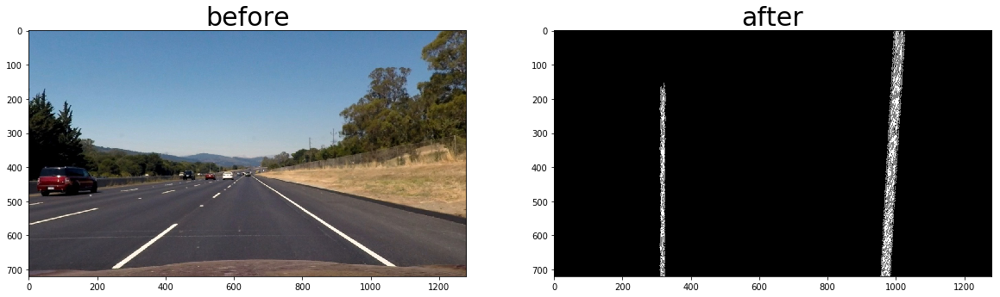

In [104]:
def perspective_transform(img):
    '''img is undistorted image'''
    img_size = img.shape[1::-1]
    src = np.float32([
        [400,550],
        [900,580],
        [1100,680],
        [220, 650],
    ])
    
    offsetx = 250
    offsety = 0
    img_size = (img.shape[1], img.shape[0])
    dst = np.float32([[offsetx, offsety], [img_size[0]-offsetx, offsety], 
                                     [img_size[0]-offsetx, img_size[1]-offsety], 
                                     [offsetx, img_size[1]-offsety]])
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(img, M, img_size)
    return warped
    
for p in glob.glob('output_images/undist_*.jpg'):
    undist = cv2.imread(p)
    warped = perspective_transform(s_channel_sobelx_threshold(undist))
    show_images(undist, warped) #display some samples

# 5. Detect lane pixels and fit to find the lane boundary.

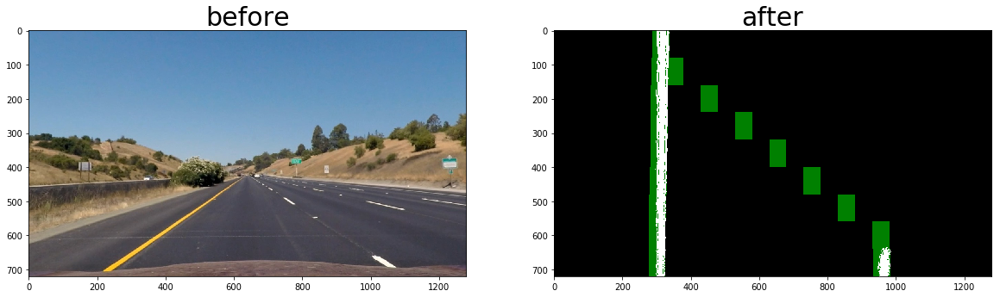

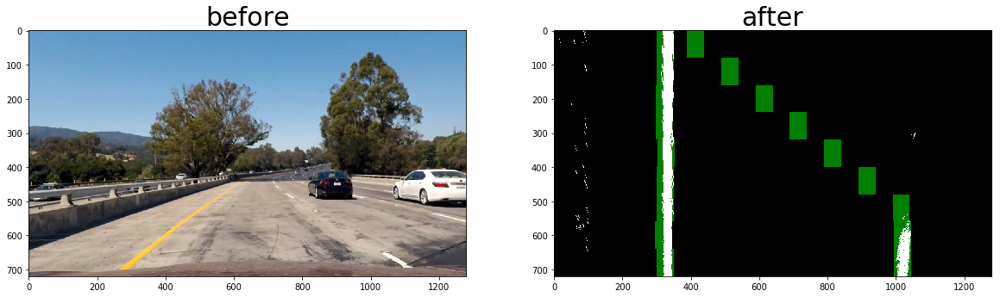

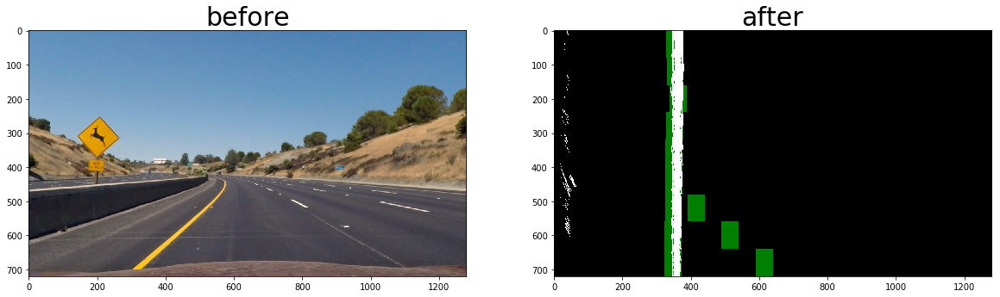

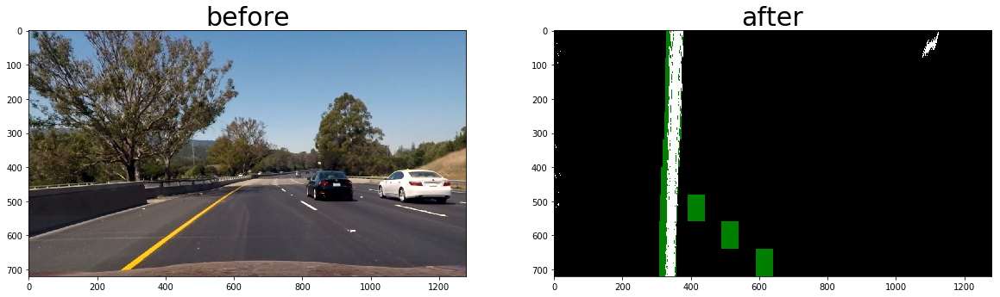

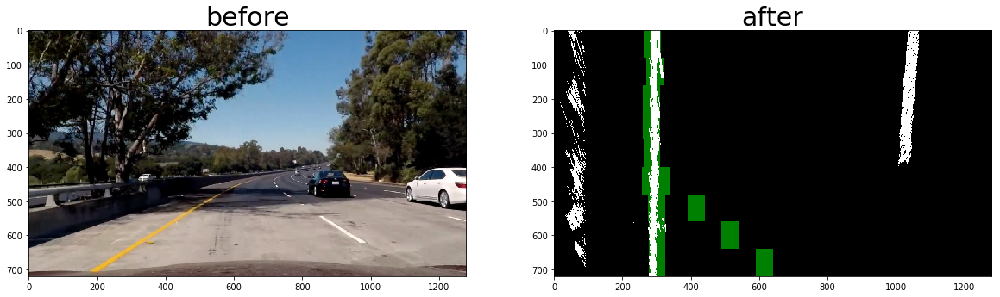

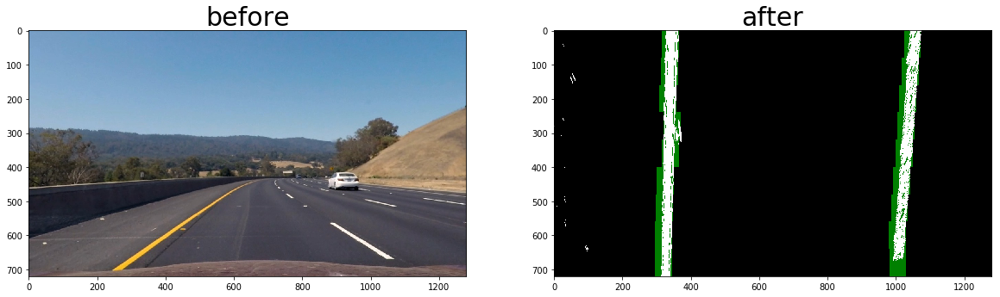

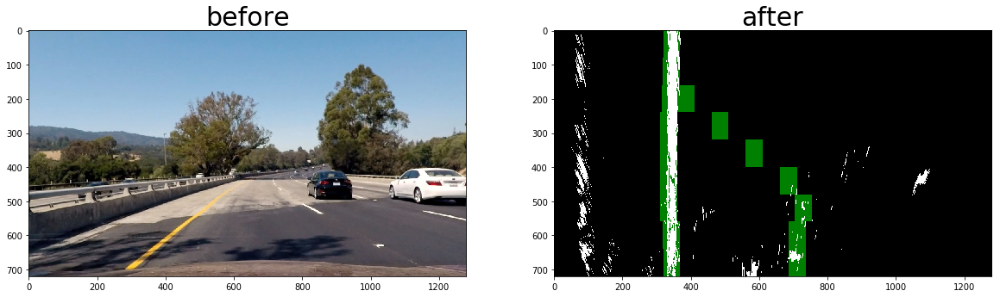

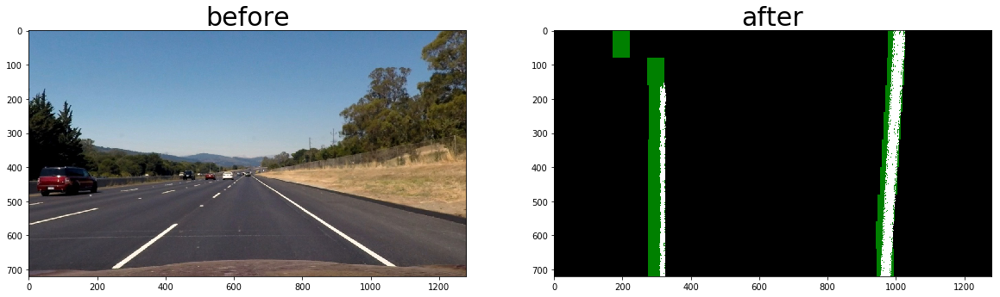

In [106]:
def window_mask(width, height, img_ref, center,level):
    output = np.zeros_like(img_ref)
    output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),max(0,int(center-width/2)):min(int(center+width/2),img_ref.shape[1])] = 1
    return output

def find_window_centroids(image, window_width, window_height, margin):
    
    window_centroids = [] # Store the (left,right) window centroid positions per level
    window = np.ones(window_width) # Create our window template that we will use for convolutions
    
    # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
    # and then np.convolve the vertical image slice with the window template 
    
    # Sum quarter bottom of image to get slice, could use a different ratio
    l_sum = np.sum(image[int(3*image.shape[0]/4):,:int(image.shape[1]/2)], axis=0)
    l_center = np.argmax(np.convolve(window,l_sum))-window_width/2
    r_sum = np.sum(image[int(3*image.shape[0]/4):,int(image.shape[1]/2):], axis=0)
    r_center = np.argmax(np.convolve(window,r_sum))-window_width/2+int(image.shape[1]/2)
    
    # Add what we found for the first layer
    window_centroids.append((l_center,r_center))
    
    # Go through each layer looking for max pixel locations
    for level in range(1,(int)(image.shape[0]/window_height)):
        # convolve the window into the vertical slice of the image
        image_layer = np.sum(image[int(image.shape[0]-(level+1)*window_height):int(image.shape[0]-level*window_height),:], axis=0)
        conv_signal = np.convolve(window, image_layer)
        # Find the best left centroid by using past left center as a reference
        # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
        offset = window_width/2
        l_min_index = int(max(l_center+offset-margin,0))
        l_max_index = int(min(l_center+offset+margin,image.shape[1]))
        l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
        # Find the best right centroid by using past right center as a reference
        r_min_index = int(max(r_center+offset-margin,0))
        r_max_index = int(min(r_center+offset+margin,image.shape[1]))
        r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
        # Add what we found for that layer
        window_centroids.append((l_center,r_center))

    return window_centroids

def detect_lane_pixel(warped, window_width, window_height, margin):
    window_centroids = find_window_centroids(warped, window_width, window_height, margin)

    # If we found any window centers
    if len(window_centroids) > 0:

        # Points used to draw all the left and right windows
        l_points = np.zeros_like(warped)
        r_points = np.zeros_like(warped)

        # Go through each level and draw the windows 
        for level in range(0,len(window_centroids)):
            # Window_mask is a function to draw window areas
            l_mask = window_mask(window_width,window_height,warped,window_centroids[level][0],level)
            r_mask = window_mask(window_width,window_height,warped,window_centroids[level][1],level)
            # Add graphic points from window mask here to total pixels found 
            l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
            r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255

        # Draw the results
        template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
        zero_channel = np.zeros_like(template) # create a zero color channel
        template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
        warpage= np.dstack((warped, warped, warped))*255 # making the original road pixels 3 color channels
        output = cv2.addWeighted(warpage, 1, template, 0.5, 0.0) # overlay the orignal road image with window results

    # If no window centers found, just display orginal road image
    else:
        output = np.array(cv2.merge((warped,warped,warped)),np.uint8)
    return output
    # Display the final results
#     plt.imshow(output)
#     plt.title('window fitting results')
#     plt.show()

# window settings
window_width = 50 
window_height = 80 # Break image into 9 vertical layers since image height is 720
margin = 100 # How much to slide left and right for searching

for p in glob.glob('output_images/undist_*.jpg'):
    undist = cv2.imread(p)
    warped = perspective_transform(s_channel_sobelx_threshold(undist))
    lane = detect_lane_pixel(warped, window_width, window_height, margin)
    show_images(undist, lane) #display some samples